<a href="https://colab.research.google.com/github/Devanshu0502/Spotify/blob/main/Spotify_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q feature_engine autoviz dataprep 2>/dev/null
!pip install shap
!pip install catboost

In [2]:
# import libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import warnings
warnings.filterwarnings("ignore")

from autoviz import AutoViz_Class
from dataprep.datasets import load_dataset
from dataprep.eda import create_report

import shap
import matplotlib.pyplot as plt
from catboost import Pool, CatBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from feature_engine.encoding import RareLabelEncoder
from sklearn.feature_extraction.text import CountVectorizer
import re
import ast

pd.set_option('display.max_rows', 1000)

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [3]:
%%time
df = pd.read_csv('/content/playlist_2010to2022.csv').drop(['playlist_url', 'track_id', 'track_name', 'artist_id', 'album', 'artist_popularity'], axis=1)
item0 = df.shape[0]
df = df.drop_duplicates()
item1 = df.shape[0]
print(f"There are {item0-item1} duplicates found in the dataset")
df = df[~df['danceability'].isnull()]

df['duration_sec'] = df['duration_ms']*1e-3
df = df.drop(['duration_ms'], axis=1)
print(df.shape)
df.sample(5).T

There are 0 duplicates found in the dataset
(2299, 17)
CPU times: user 34.2 ms, sys: 4.91 ms, total: 39.1 ms
Wall time: 44.4 ms


,338,2004,1040,221,2038
year,2003,2020,2010,2002,2020
track_popularity,69,76,71,73,59
artist_name,Fabolous,Lil Mosey,Jay Sean,Busta Rhymes,Juice WRLD
artist_genres,"['gangster rap', 'hip hop', 'pop rap', 'rap', 'trap', 'urban contemporary']","['melodic rap', 'rap conscient']","['dance pop', 'pop', 'pop rap']","['east coast hip hop', 'hardcore hip hop', 'hip hop', 'pop rap', 'rap']","['chicago rap', 'melodic rap', 'rap']"
danceability,0.546,0.774,0.854,0.648,0.625
energy,0.538,0.554,0.674,0.759,0.811
key,7.0,0.0,11.0,6.0,0.0
loudness,-7.886,-7.909,-4.896,-4.315,-5.183
mode,0.0,1.0,1.0,1.0,1.0
speechiness,0.0523,0.0383,0.0705,0.306,0.0659


In [4]:
df['artist_name'].value_counts().head(30)

Drake                32
Taylor Swift         31
Rihanna              27
BeyoncÃ©             22
Ariana Grande        22
Calvin Harris        21
Justin Bieber        21
P!nk                 20
Ed Sheeran           19
Coldplay             18
Kanye West           18
Eminem               18
Katy Perry           17
Chris Brown          16
Black Eyed Peas      16
The Weeknd           15
Britney Spears       15
Adele                15
Post Malone          15
Billie Eilish        15
Bruno Mars           15
Maroon 5             14
USHER                14
Shawn Mendes         13
Justin Timberlake    12
Jason Derulo         12
Kendrick Lamar       12
Bad Bunny            11
Selena Gomez         11
Miley Cyrus          11
Name: artist_name, dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2299 entries, 0 to 2299
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   year              2299 non-null   int64  
 1   track_popularity  2299 non-null   int64  
 2   artist_name       2299 non-null   object 
 3   artist_genres     2299 non-null   object 
 4   danceability      2299 non-null   float64
 5   energy            2299 non-null   float64
 6   key               2299 non-null   float64
 7   loudness          2299 non-null   float64
 8   mode              2299 non-null   float64
 9   speechiness       2299 non-null   float64
 10  acousticness      2299 non-null   float64
 11  instrumentalness  2299 non-null   float64
 12  liveness          2299 non-null   float64
 13  valence           2299 non-null   float64
 14  tempo             2299 non-null   float64
 15  time_signature    2299 non-null   float64
 16  duration_sec      2299 non-null   float64


# Data visualisation

In [6]:
# An update taken from the nice work https://www.kaggle.com/code/anshtanwar/auto-eda-missing-migrants-interactive-charts
# made by @anshtanwar
AV = AutoViz_Class()
filename = ""
target_variable = 'track_popularity'
custom_plot_dir = "custom_plot_directory"

dft = AV.AutoViz(
    filename,
    sep=",",
    depVar=target_variable,
    dfte=df,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="html",
    max_rows_analyzed=min([df.shape[0], 10**3]),
    max_cols_analyzed=min([df.shape[1], 50]),
    save_plot_dir=custom_plot_dir
)

    Since nrows is smaller than dataset, loading random sample of 1000 rows into pandas...
Shape of your Data Set loaded: (1000, 17)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    16 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 1000 exceeds maximum, randomly sampling 1000 rows for EDA...

################ Regression problem #####################
Saving scatterplots in HTML format
Saving pair_scatters in HTML format


Saving distplots_cats in HTML format
Saving distplots_nums in HTML format
Saving kde_plots in HTML format
Saving violinplots in HTML format
Saving heatmaps in HTML format
Saving timeseries_plots in HTML format
                                               

Saving cat_var_plots in HTML format
                                               

Time to run AutoViz (in seconds) = 75


In [7]:
from IPython.core.display import display, HTML

# Define the list of file names
from pathlib import Path
file_names = []
for file in Path(f'/colab/working/{custom_plot_dir}/{target_variable}/').glob('*.html'):
    filename = str(file).split('/')[-1]
    file_names.append(filename)

# Loop through the list and display each HTML file
for file_name in file_names:
    file_path = f'/colab/working/{custom_plot_dir}/{target_variable}/{file_name}'
    with open(file_path, 'r') as file:
        html_content = file.read()
        display(HTML(html_content))

DataPrep Report
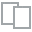
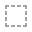
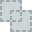
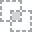
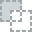
...
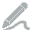
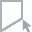
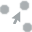
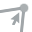
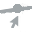

In [8]:
create_report(df)

# Data transformation

In [9]:
df.columns

Index(['year', 'track_popularity', 'artist_name', 'artist_genres',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'duration_sec'],
      dtype='object')

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
year,2299.0,2011.003045,6.634528,2000.000000,2005.00000,2011.0000,2017.000000,2022.000
track_popularity,2299.0,70.944759,12.294047,0.000000,66.00000,72.0000,79.000000,100.000
danceability,2299.0,0.660116,0.141137,0.162000,0.57200,0.6710,0.759500,0.975
energy,2299.0,0.693047,0.164838,0.051900,0.58600,0.7120,0.820000,0.999
key,2299.0,5.277947,3.628494,0.000000,2.00000,5.0000,8.000000,11.000
loudness,2299.0,-5.784040,2.080853,-21.107000,-6.82350,-5.5110,-4.364500,-0.276
mode,2299.0,0.598521,0.490304,0.000000,0.00000,1.0000,1.000000,1.000
speechiness,2299.0,0.097795,0.092445,0.022500,0.03800,0.0568,0.115500,0.576
acousticness,2299.0,0.157689,0.203844,0.000013,0.01650,0.0689,0.223000,0.978
instrumentalness,2299.0,0.013766,0.083990,0.000000,0.00000,0.0000,0.000054,0.985


In [11]:
main_label = 'track_popularity'

# convert columns to to str
for col in ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence']:
    df[col] = df[col].apply(lambda x: str(round(1/10*round(10*x),1)) )


# vectorize columns
def vectorize_column(df, col_name, min_df=20):

    try:
        df[col_name] = df[col_name].apply(ast.literal_eval)
        df[col_name] = df[col_name].apply(lambda x: ', '.join(list(set(x))))
    except:
        pass
    ll = df[col_name].fillna('none').str.split(', ').to_list()
    ll = [[j.rstrip(', ').strip(' ').replace('/', '_').replace('.', '_').replace('+', '_').replace(',', '_').replace('\'', '_').replace(' ', '_').replace('.', '_').replace('&', '_').replace('-', '_').replace('!', '_') for j in i] for i in ll]
    ll1 = []
    for item in ll:
        if item != ['none']:
            ttt = ' '.join(item)
        else:
            ttt = 'none'
        ll1.append(ttt)
    vectorizer = CountVectorizer(max_features=60, min_df=min_df, lowercase=False)
    vectorizer.fit(ll1)
    voc = vectorizer.vocabulary_
    voc_inv = {v: col_name+'_'+k for k, v in voc.items()}
    vector = vectorizer.transform(ll1)
    tt = pd.DataFrame(vector.toarray())
    tt = tt.rename(columns=voc_inv)
    df = pd.concat([df.reset_index(drop=True),tt.reset_index(drop=True)], axis=1).drop([col_name], axis=1)
    return df
for col in ['artist_genres']:
    df = vectorize_column(df, col_name=col, min_df=10)

# bin numerical cols in equal qcuts
def bin_column(df, col_name, num_bins=7):

    # Calculate the bin edges to evenly split the numerical column
    bin_edges = pd.qcut(df[col_name], q=num_bins, retbins=True)[1]

    # Define labels for the categorical bins based on bin edges
    bin_labels = [f'{int(bin_edges[i])}-{int(bin_edges[i+1])}' for i in range(num_bins)]

    # Use pd.qcut to create quantile-based bins with equal number of records in each bin
    df[col_name] = pd.qcut(df[col_name], q=num_bins, labels=False)

    # Update the bin labels to be more descriptive
    df[col_name] = df[col_name].map(lambda x: bin_labels[x])

    # Convert the column to object dtype
    df[col_name] = df[col_name].astype('object')

    return df



for col in df.columns:
    if col != main_label and not col.startswith('artist_genres'):
        try:
            df = bin_column(df, col)
            print(f"Binned column {col}")
        except:
            df[col] = df[col].fillna('None').astype(str)
            encoder = RareLabelEncoder(n_categories=1, max_n_categories=70, replace_with='Other', tol=8/df.shape[0])
            df[col] = encoder.fit_transform(df[[col]])
            print(f"LabelEncoded column {col}")


print(df.shape)
df.sample(5).T

Binned column year
LabelEncoded column artist_name
LabelEncoded column danceability
LabelEncoded column energy
Binned column key
LabelEncoded column loudness
LabelEncoded column mode
LabelEncoded column speechiness
LabelEncoded column acousticness
LabelEncoded column instrumentalness
LabelEncoded column liveness
LabelEncoded column valence
Binned column tempo
LabelEncoded column time_signature
Binned column duration_sec
(2299, 76)


,760,133,2060,675,755
year,2006-2009,2000-2003,2019-2022,2003-2006,2006-2009
track_popularity,67,71,63,61,68
artist_name,Other,Other,Other,BeyoncÃ©,Christina Aguilera
danceability,0.5,0.8,0.7,0.7,0.7
energy,0.9,0.8,0.6,0.8,0.8
key,0-1,0-1,6-8,6-8,6-8
loudness,-3.3,Other,-5.4,-6.8,-4.7
mode,1.0,1.0,0.0,1.0,0.0
speechiness,0.1,0.2,0.0,0.3,0.2
acousticness,0.1,0.5,0.1,0.1,0.0


In [12]:
df['artist_name'].value_counts()

Other                 1504
Drake                   32
Taylor Swift            31
Rihanna                 27
BeyoncÃ©                22
Ariana Grande           22
Calvin Harris           21
Justin Bieber           21
P!nk                    20
Ed Sheeran              19
Kanye West              18
Coldplay                18
Eminem                  18
Katy Perry              17
Chris Brown             16
Black Eyed Peas         16
Britney Spears          15
Bruno Mars              15
Post Malone             15
The Weeknd              15
Adele                   15
Billie Eilish           15
Maroon 5                14
USHER                   14
Shawn Mendes            13
Jason Derulo            12
Justin Timberlake       12
Kendrick Lamar          12
David Guetta            11
Bad Bunny               11
Selena Gomez            11
Lady Gaga               11
Avril Lavigne           11
Miley Cyrus             11
Dua Lipa                10
One Direction           10
Flo Rida                10
L

# Machine learning

In [13]:
# initialize data
y = df[main_label].values.reshape(-1,)
X = df.drop([main_label], axis=1)
cat_cols = df.select_dtypes(include=['object']).columns
cat_cols_idx = [list(X.columns).index(c) for c in cat_cols]
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.5, random_state=0, stratify=df[['artist_name']])
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1149, 75), (1150, 75), (1149,), (1150,))

In [14]:
%%time
# initialize Pool
train_pool = Pool(X_train,
                  y_train,
                  cat_features=cat_cols_idx)
test_pool = Pool(X_test,
                 y_test,
                 cat_features=cat_cols_idx)
# specify the training parameters
model = CatBoostRegressor(iterations=170,
                          depth=5,
                          verbose=0,
                          learning_rate=0.05,
                          loss_function='RMSE')
#train the model
model.fit(train_pool)
# make the prediction using the resulting model
y_train_pred = model.predict(train_pool)
y_test_pred = model.predict(test_pool)

rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
print(f"RMSE score for train {round(rmse_train,3)} points, and for test {round(rmse_test,3)} points")

RMSE score for train 11.288 points, and for test 11.091 points
CPU times: user 820 ms, sys: 136 ms, total: 955 ms
Wall time: 1.17 s


In [15]:
# Baseline scores (assuming the same prediction for all data samples)
rmse_bs_train = mean_squared_error(y_train, [np.mean(y_train)]*len(y_train), squared=False)
rmse_bs_test = mean_squared_error(y_test, [np.mean(y_train)]*len(y_test), squared=False)
print(f"RMSE baseline score for train {round(rmse_bs_train,3)} points, and for test {round(rmse_bs_test,3)} points")

RMSE baseline score for train 12.736 points, and for test 11.831 points


# Explanations with SHAP values

In [16]:
%matplotlib inline

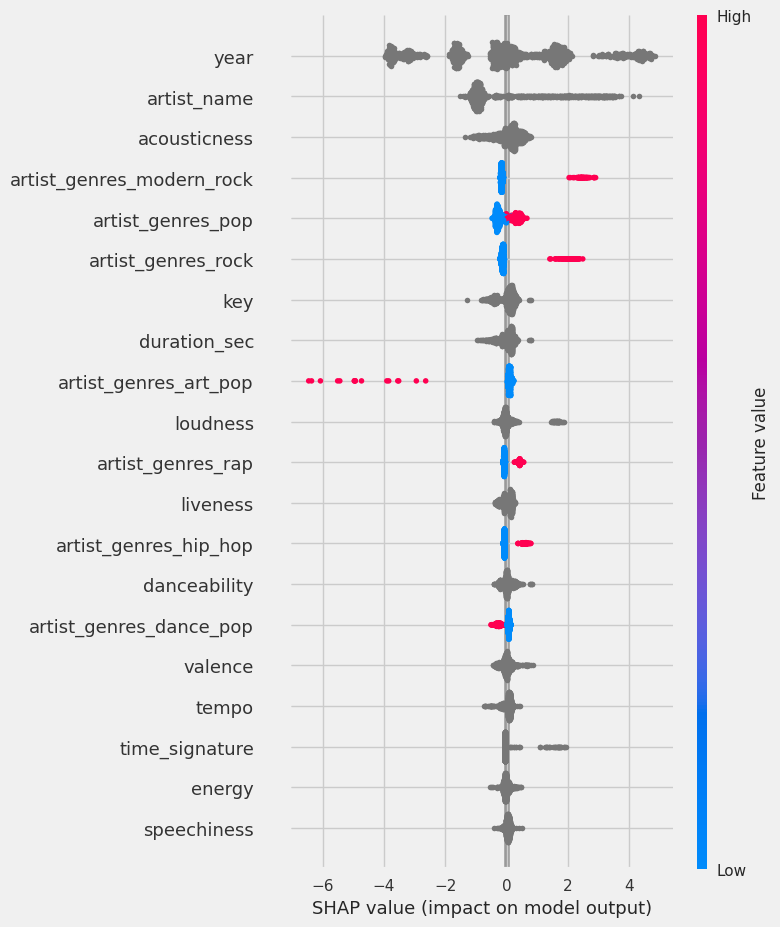

CPU times: user 1.48 s, sys: 322 ms, total: 1.8 s
Wall time: 1.86 s


In [17]:
%%time
shap.initjs()
ex = shap.TreeExplainer(model)
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [18]:
expected_values = ex.expected_value
print(f"Average predicted track popularity is {round(expected_values, 2)} points")
print(f"Average actual track popularity is {round(np.mean(y_test), 2)} points")

Average predicted track popularity is 70.92 points
Average actual track popularity is 70.97 points


In [19]:
def show_shap0(col):
    df_infl = X_test.copy()
    df_infl['shap_'] = shap_values[:,X_test.columns.tolist().index(col)]
    gain = 0
    gain = df_infl.groupby(col).mean().loc[1, 'shap_']-df_infl.groupby(col).mean().loc[0, 'shap_']
    gain_std = ((df_infl.groupby(col).std().loc[1, 'shap_'])**2+(df_infl.groupby(col).std().loc[0, 'shap_'])**2)**0.5
    return round(gain,4), round(gain_std,4)
def show_variants(start_str):
    col_list = []
    gain_list = []
    gain_std_list = []
    for col in X_test.columns:
        if col.startswith(start_str+'_'):
            try:
                gain, gain_std = show_shap0(col)
                col_list.append(col.replace(start_str+'_',''))
                gain_list.append(gain)
                gain_std_list.append(gain_std)
            except:
                pass
    dd_dict = {'col': col_list, 'gain': gain_list, 'gain_std': gain_std_list}
    df_res = pd.DataFrame.from_dict(dd_dict).sort_values('gain', ascending=False).set_index('col')
    plt.figure(figsize=(15,10))
    plt.errorbar(df_res.index, df_res['gain'], yerr=df_res['gain_std'], fmt="o", color="r")
    plt.bar(x=df_res.index, height=df_res['gain'])
    plt.title(f'SHAP values for {start_str}, rating')
    plt.ylabel('points')
    plt.tick_params(axis="x", rotation=90)
    plt.show();
    return df_res

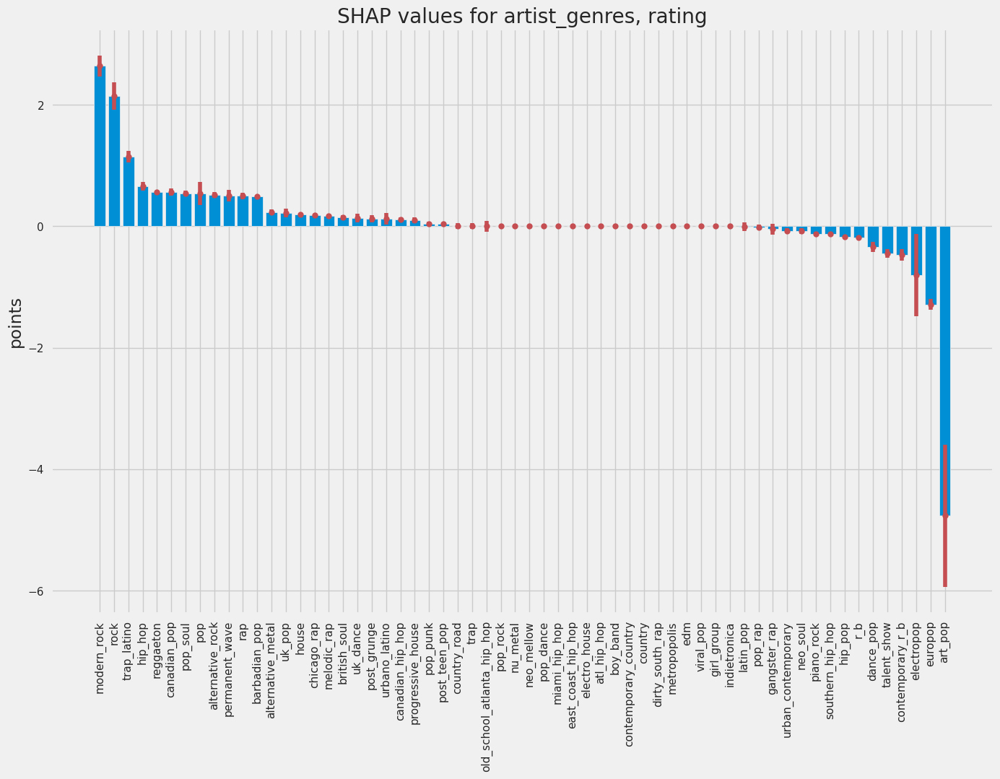

,gain,gain_std
col,,
modern_rock,2.6406,0.1724
rock,2.1448,0.2302
trap_latino,1.1406,0.0953
hip_hop,0.6624,0.0730
reggaeton,0.5686,0.0240
canadian_pop,0.5661,0.0611
pop_soul,0.5450,0.0412
pop,0.5444,0.1904
alternative_rock,0.5149,0.0461


In [20]:
show_variants(start_str='artist_genres')


year



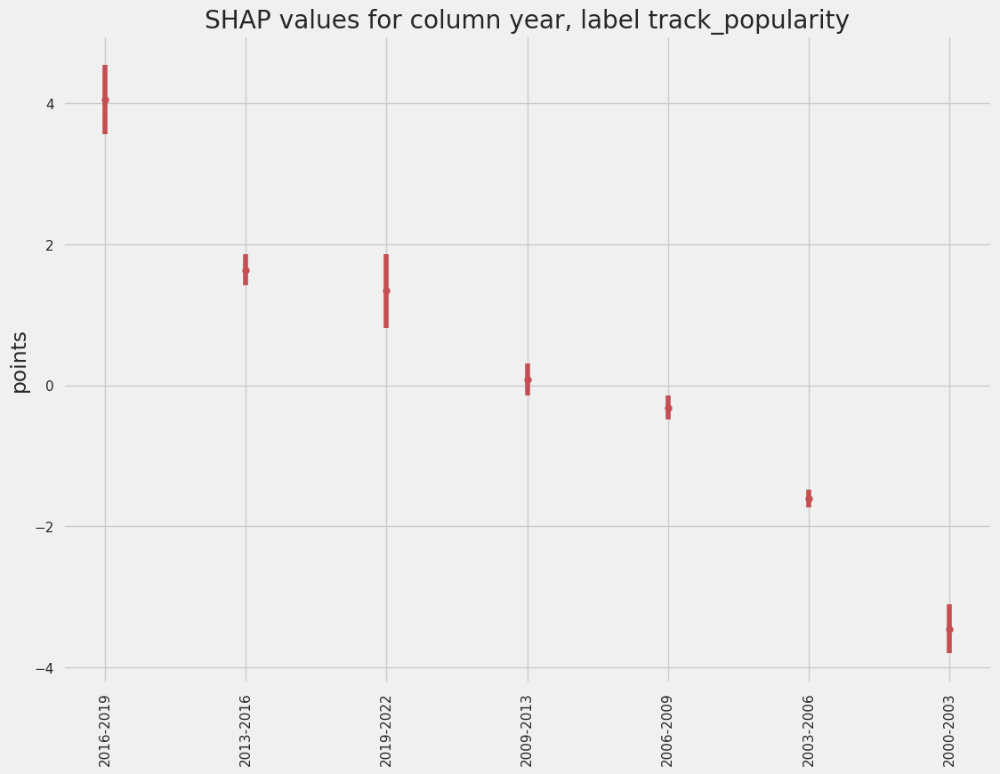

            gain   gain_std  count
col                               
2016-2019  4.0542   0.4919    151 
2013-2016  1.6347   0.2181    139 
2019-2022  1.3392   0.5233    152 
2009-2013  0.0825   0.2263    214 
2006-2009 -0.3158   0.1713    153 
2003-2006 -1.6023   0.1239    154 
2000-2003 -3.4569   0.3464    187 

artist_name



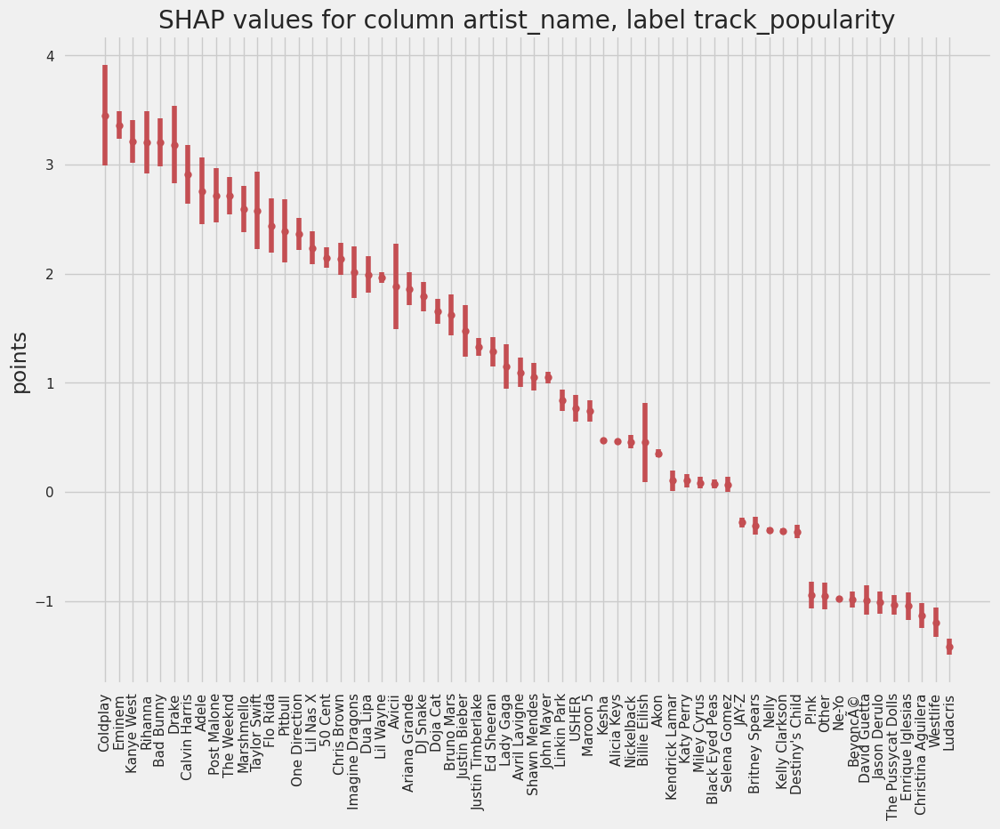

                     gain   gain_std  count
col                                        
Coldplay            3.4518   0.4614      9 
Eminem              3.3630   0.1292      9 
Kanye West          3.2103   0.1963      9 
Rihanna             3.2060   0.2876     14 
Bad Bunny           3.2049   0.2171      5 
Drake               3.1823   0.3522     16 
Calvin Harris       2.9068   0.2689     11 
Adele               2.7593   0.3065      8 
Post Malone         2.7172   0.2467      8 
The Weeknd          2.7165   0.1693      8 
Marshmello          2.5925   0.2089      4 
Taylor Swift        2.5776   0.3551     16 
Flo Rida            2.4414   0.2500      5 
Pitbull             2.3915   0.2890      4 
One Direction       2.3613   0.1468      5 
Lil Nas X           2.2359   0.1528      4 
50 Cent             2.1483   0.0905      4 
Chris Brown         2.1379   0.1484      8 
Imagine Dragons     2.0160   0.2368      4 
Dua Lipa            1.9903   0.1665      5 
Lil Wayne           1.9625   0.0

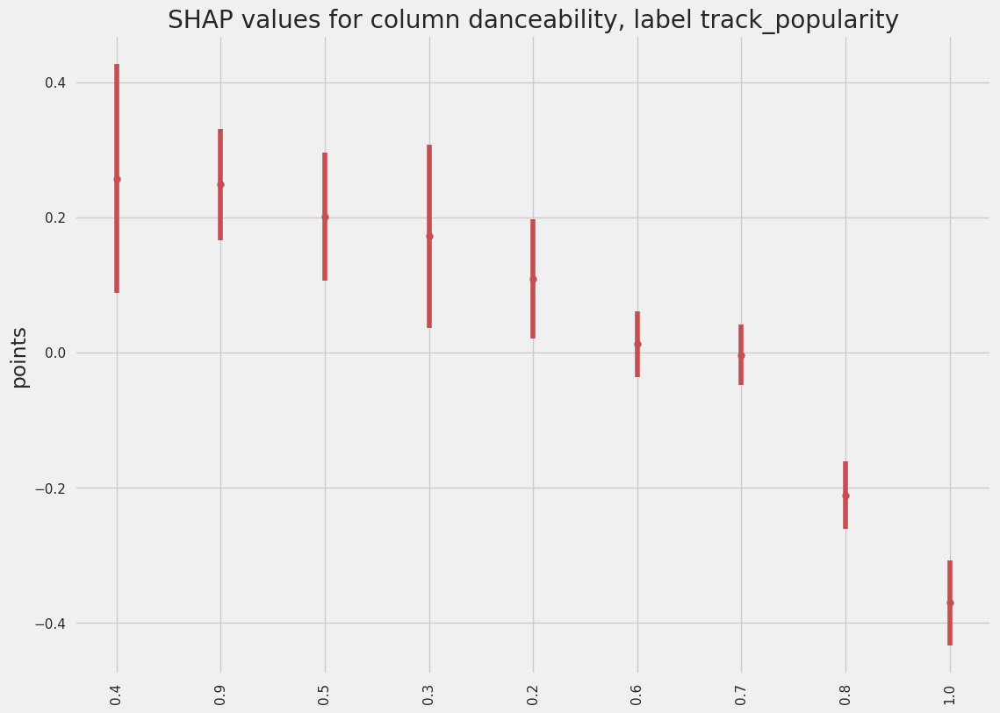

      gain   gain_std  count
col                         
0.4  0.2577   0.1692     69 
0.9  0.2488   0.0820     87 
0.5  0.2012   0.0945    134 
0.3  0.1723   0.1360     30 
0.2  0.1094   0.0880      6 
0.6  0.0128   0.0488    272 
0.7 -0.0034   0.0448    328 
0.8 -0.2108   0.0495    218 
1.0 -0.3700   0.0631      6 

energy



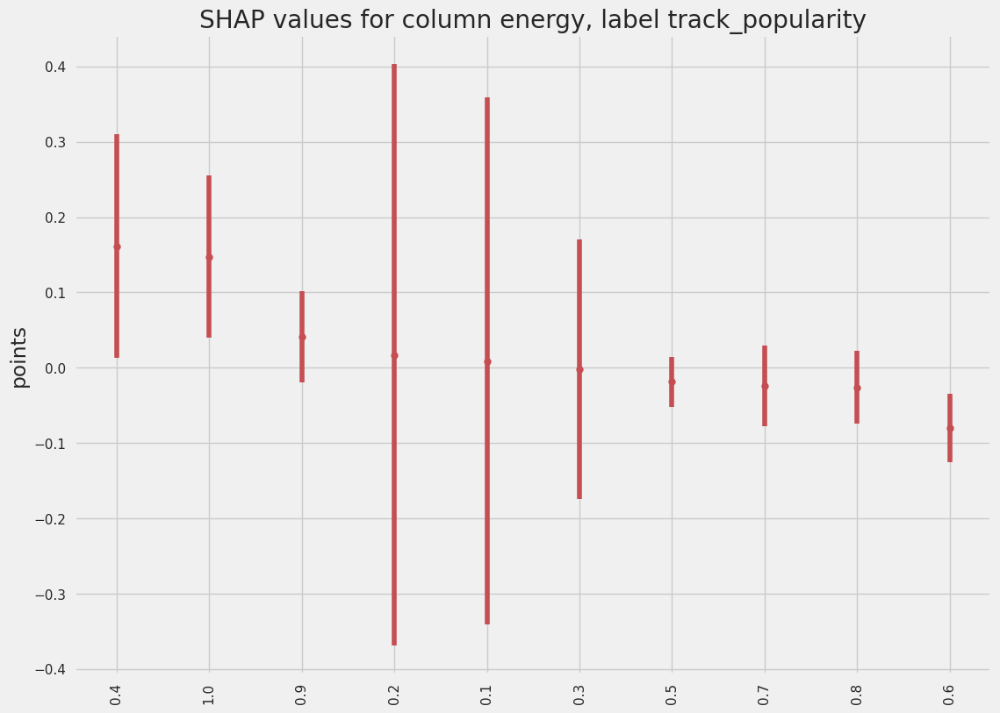

      gain   gain_std  count
col                         
0.4  0.1613   0.1484     58 
1.0  0.1475   0.1079     26 
0.9  0.0409   0.0608    200 
0.2  0.0173   0.3856      9 
0.1  0.0090   0.3494      5 
0.3 -0.0018   0.1727     27 
0.5 -0.0186   0.0332    121 
0.7 -0.0238   0.0539    253 
0.8 -0.0260   0.0485    249 
0.6 -0.0798   0.0457    202 

key



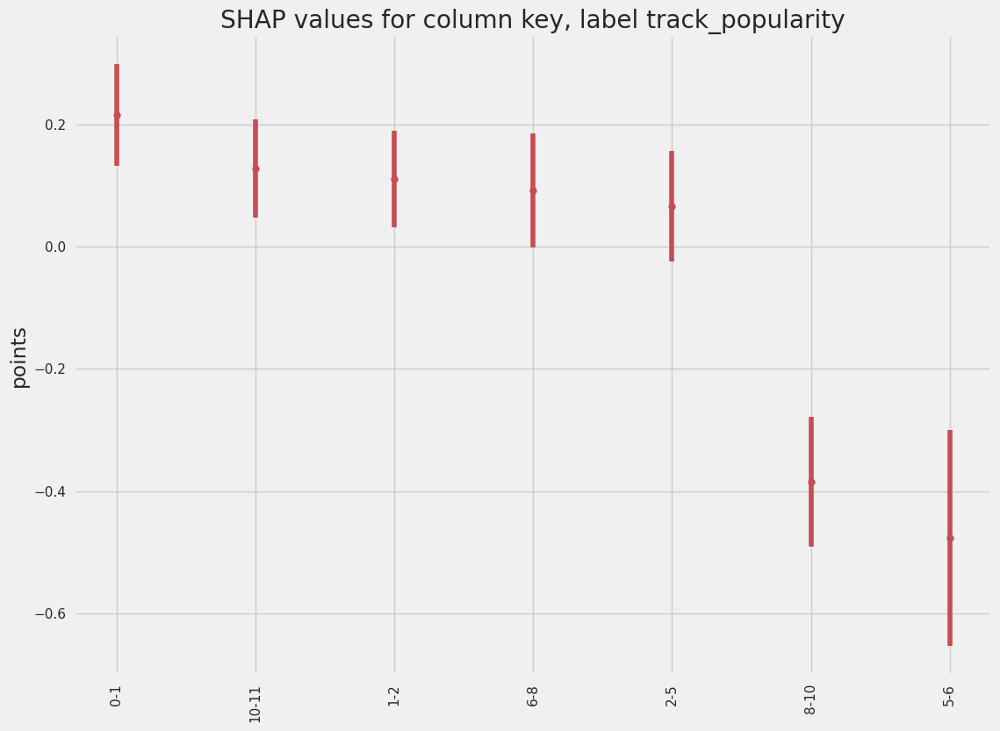

        gain   gain_std  count
col                           
0-1    0.2149   0.0829    267 
10-11  0.1280   0.0801    120 
1-2    0.1108   0.0787     91 
6-8    0.0919   0.0935    195 
2-5    0.0662   0.0902    221 
8-10  -0.3847   0.1067    164 
5-6   -0.4768   0.1767     92 

loudness



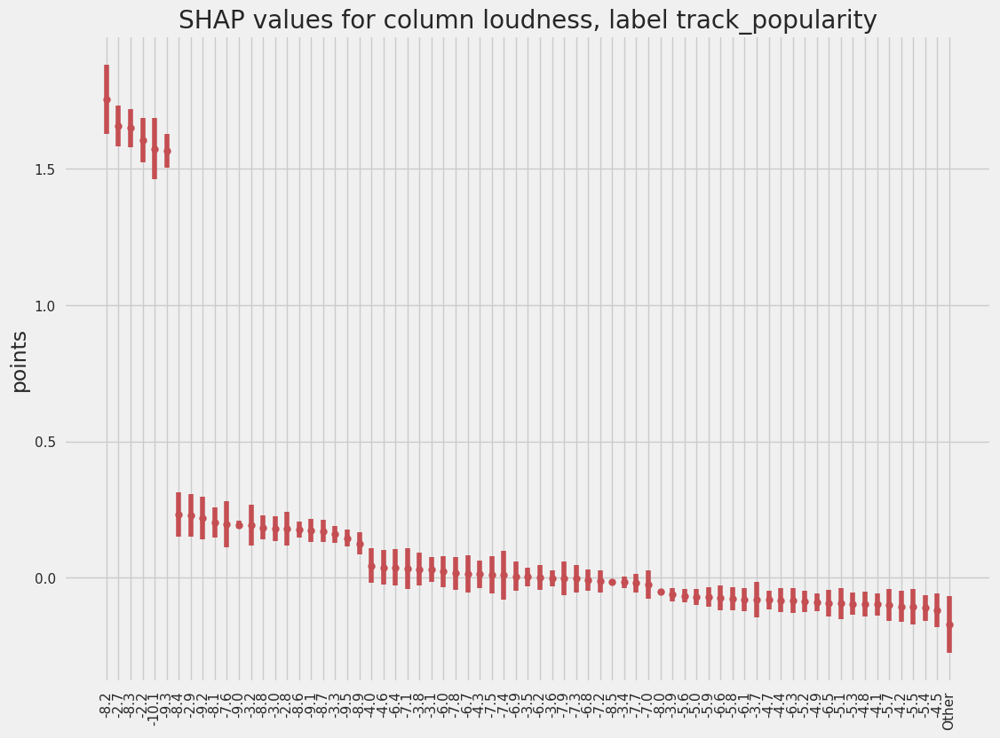

        gain   gain_std  count
col                           
-8.2   1.7549   0.1276     5  
-2.7   1.6577   0.0735    10  
-8.3   1.6504   0.0700     9  
-2.2   1.6046   0.0811     4  
-10.1  1.5740   0.1124     5  
-9.3   1.5669   0.0624     7  
-8.4   0.2327   0.0803     8  
-2.9   0.2284   0.0787    11  
-9.2   0.2193   0.0774     5  
-8.1   0.2020   0.0553    10  
-7.6   0.1965   0.0832    14  
-9.0   0.1940   0.0145     2  
-3.2   0.1936   0.0755    19  
-8.8   0.1849   0.0449     6  
-3.0   0.1808   0.0448    10  
-2.8   0.1804   0.0613     5  
-8.6   0.1761   0.0287     6  
-9.1   0.1746   0.0421     4  
-8.7   0.1719   0.0416     7  
-3.3   0.1602   0.0309    12  
-9.5   0.1461   0.0321     3  
-8.9   0.1252   0.0405     4  
-4.0   0.0451   0.0649    19  
-4.6   0.0384   0.0629    23  
-6.4   0.0383   0.0673    16  
-7.1   0.0346   0.0741    16  
-3.8   0.0318   0.0591    23  
-3.1   0.0309   0.0448    13  
-6.0   0.0236   0.0567    26  
-7.8   0.0171   0.0599    13  
-6.7   0

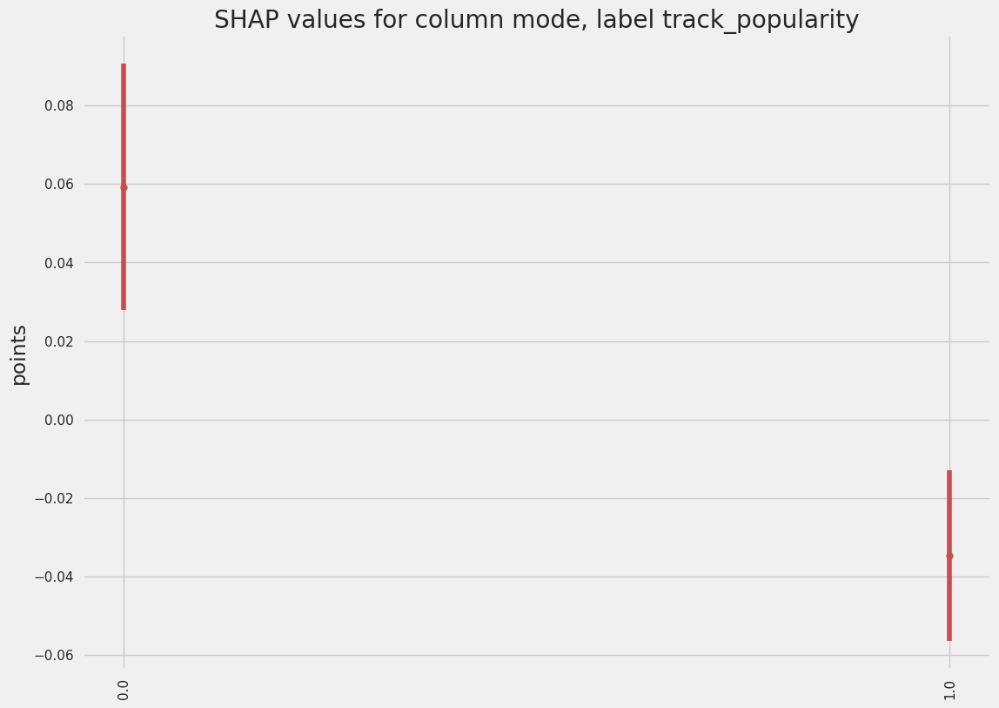

      gain   gain_std  count
col                         
0.0  0.0592   0.0314    459 
1.0 -0.0347   0.0217    691 

speechiness



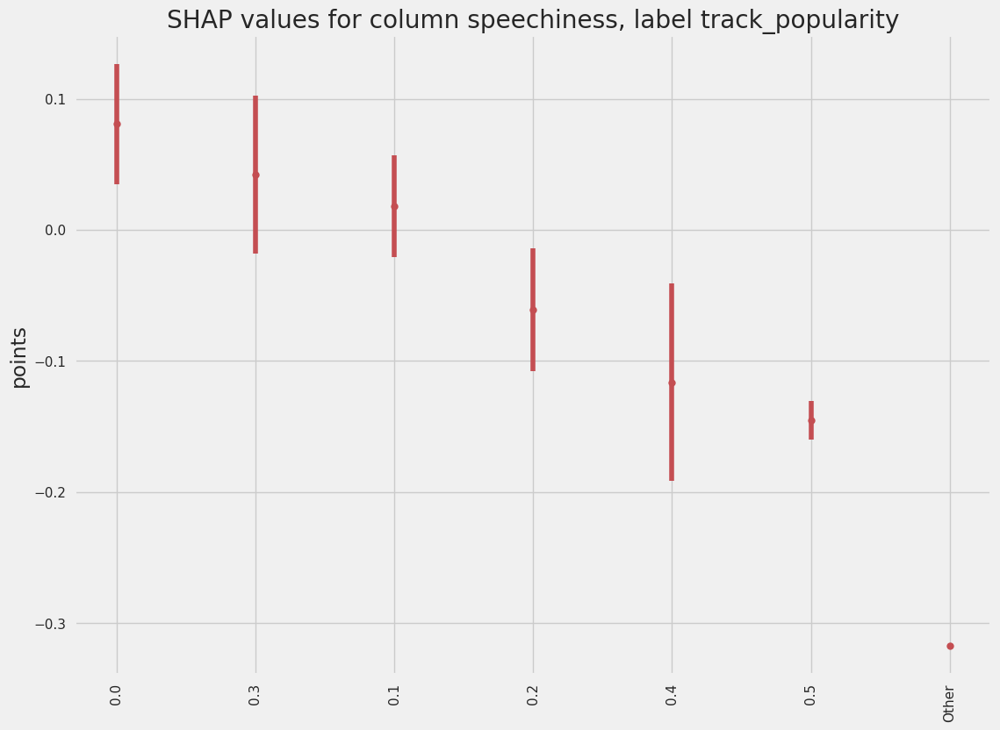

        gain   gain_std  count
col                           
0.0    0.0806   0.0459    502 
0.3    0.0422   0.0601     71 
0.1    0.0183   0.0388    429 
0.2   -0.0610   0.0466    116 
0.4   -0.1164   0.0752     24 
0.5   -0.1454   0.0146      7 
Other -0.3171      NaN      1 

acousticness



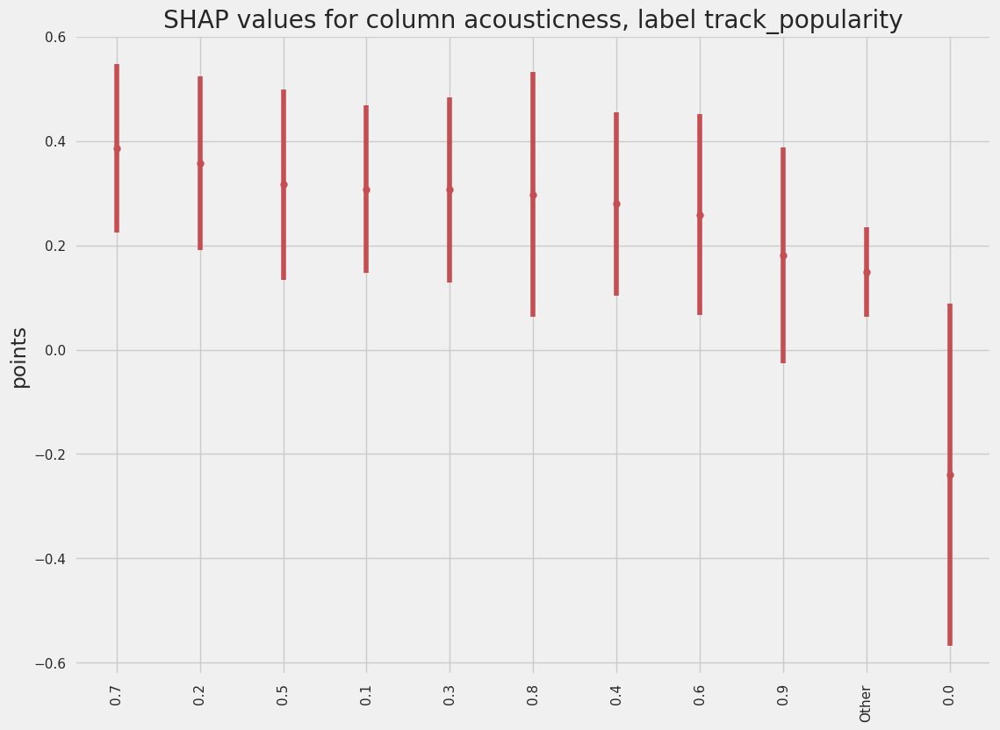

        gain   gain_std  count
col                           
0.7    0.3863   0.1611     20 
0.2    0.3571   0.1670    132 
0.5    0.3165   0.1827     38 
0.1    0.3076   0.1608    264 
0.3    0.3063   0.1773     92 
0.8    0.2971   0.2342     11 
0.4    0.2796   0.1756     52 
0.6    0.2585   0.1923     30 
0.9    0.1809   0.2069     16 
Other  0.1485   0.0858      5 
0.0   -0.2389   0.3279    490 

instrumentalness



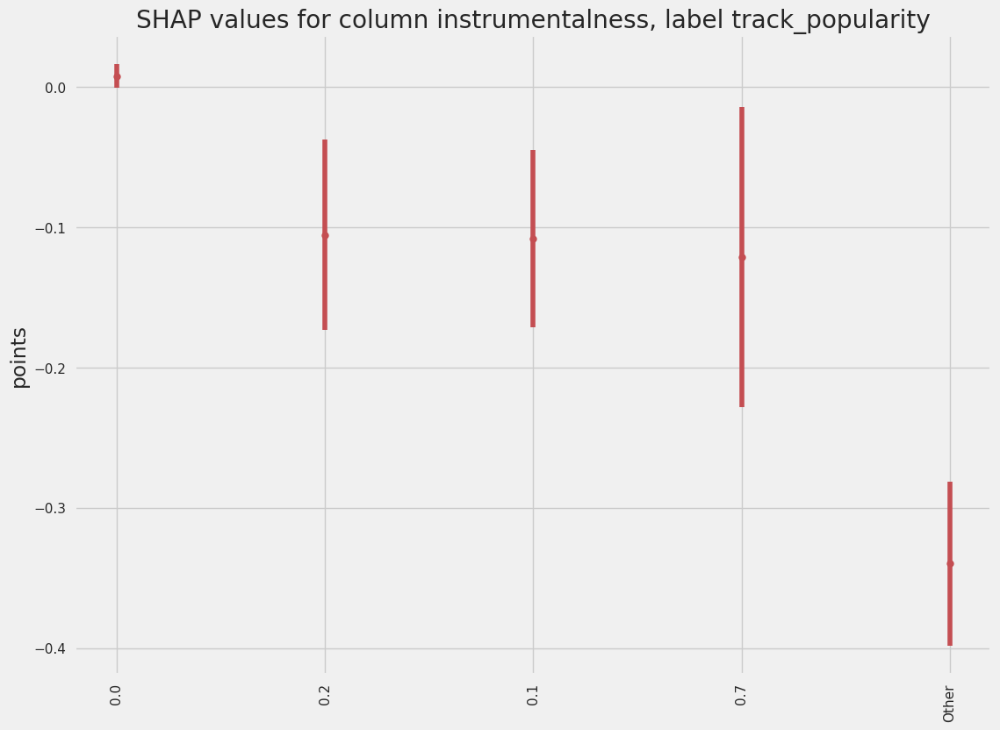

        gain   gain_std  count
col                           
0.0    0.0078   0.0086   1102 
0.2   -0.1054   0.0680      8 
0.1   -0.1080   0.0632     25 
0.7   -0.1210   0.1070      5 
Other -0.3396   0.0584     10 

liveness



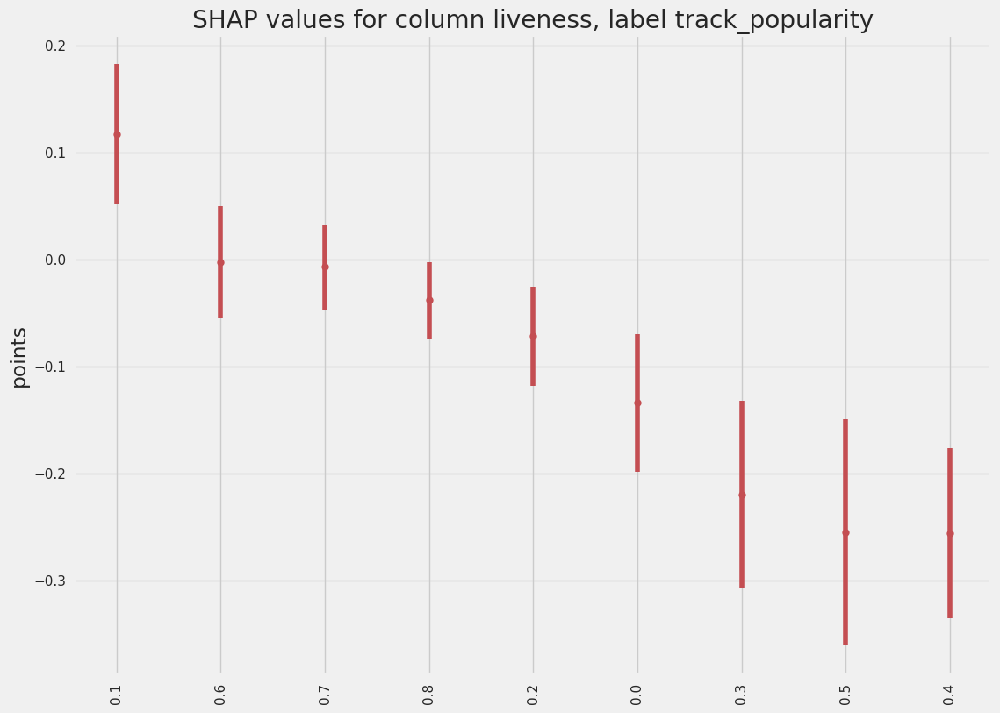

      gain   gain_std  count
col                         
0.1  0.1172   0.0655    662 
0.6 -0.0024   0.0527     24 
0.7 -0.0067   0.0396      8 
0.8 -0.0380   0.0358      4 
0.2 -0.0715   0.0465    195 
0.0 -0.1338   0.0643     55 
0.3 -0.2195   0.0877    136 
0.5 -0.2549   0.1055     11 
0.4 -0.2558   0.0795     55 

valence



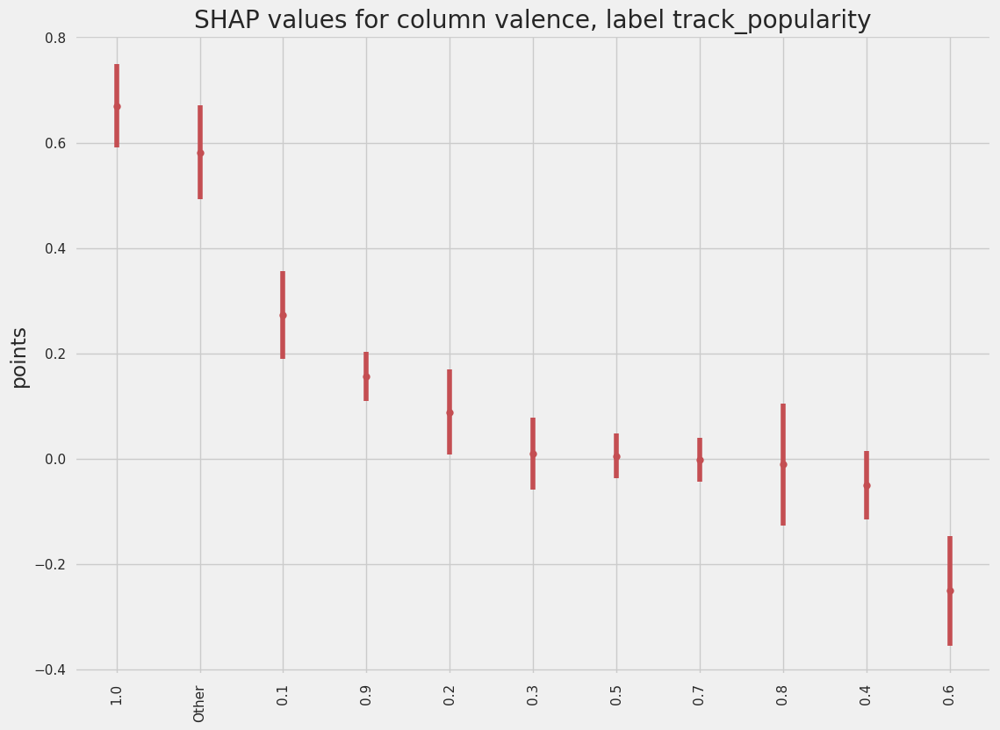

        gain   gain_std  count
col                           
1.0    0.6700   0.0793     17 
Other  0.5815   0.0889      3 
0.1    0.2720   0.0831     50 
0.9    0.1562   0.0461     81 
0.2    0.0883   0.0812     93 
0.3    0.0091   0.0683    116 
0.5    0.0049   0.0420    179 
0.7   -0.0026   0.0414    155 
0.8   -0.0107   0.1158    127 
0.4   -0.0507   0.0649    167 
0.6   -0.2513   0.1037    162 

tempo



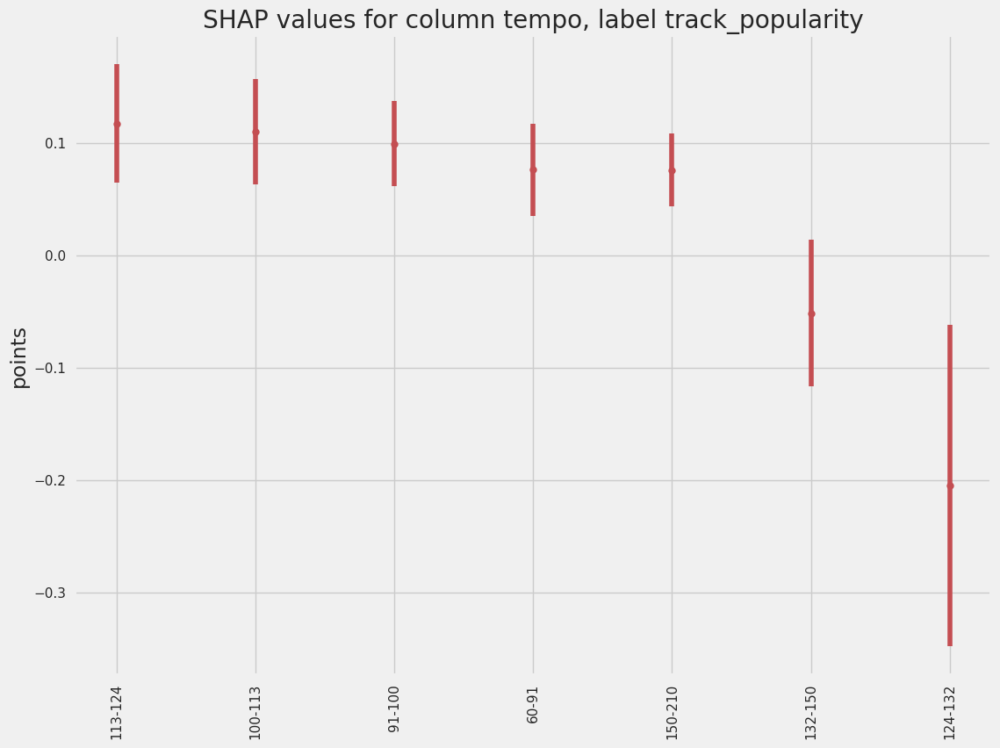

          gain   gain_std  count
col                             
113-124  0.1174   0.0528    161 
100-113  0.1100   0.0471    153 
91-100   0.0994   0.0377    160 
60-91    0.0761   0.0412    173 
150-210  0.0759   0.0324    165 
132-150 -0.0514   0.0651    164 
124-132 -0.2049   0.1428    174 

time_signature



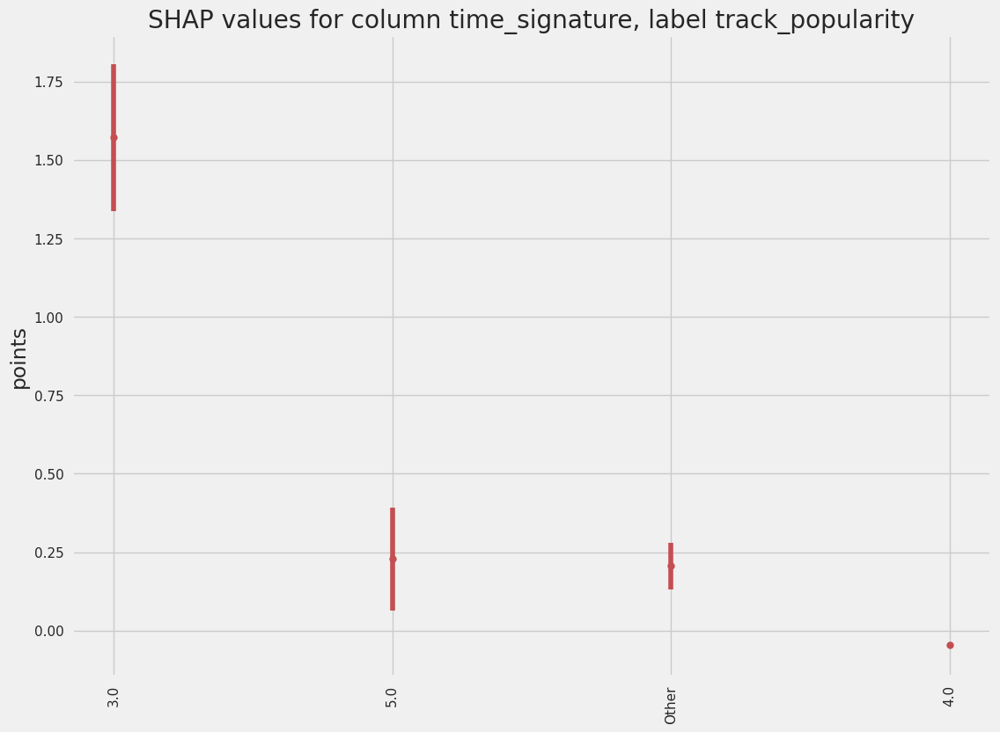

        gain   gain_std  count
col                           
3.0    1.5716   0.2337     30 
5.0    0.2284   0.1635     10 
Other  0.2058   0.0747      3 
4.0   -0.0461   0.0067   1107 

duration_sec



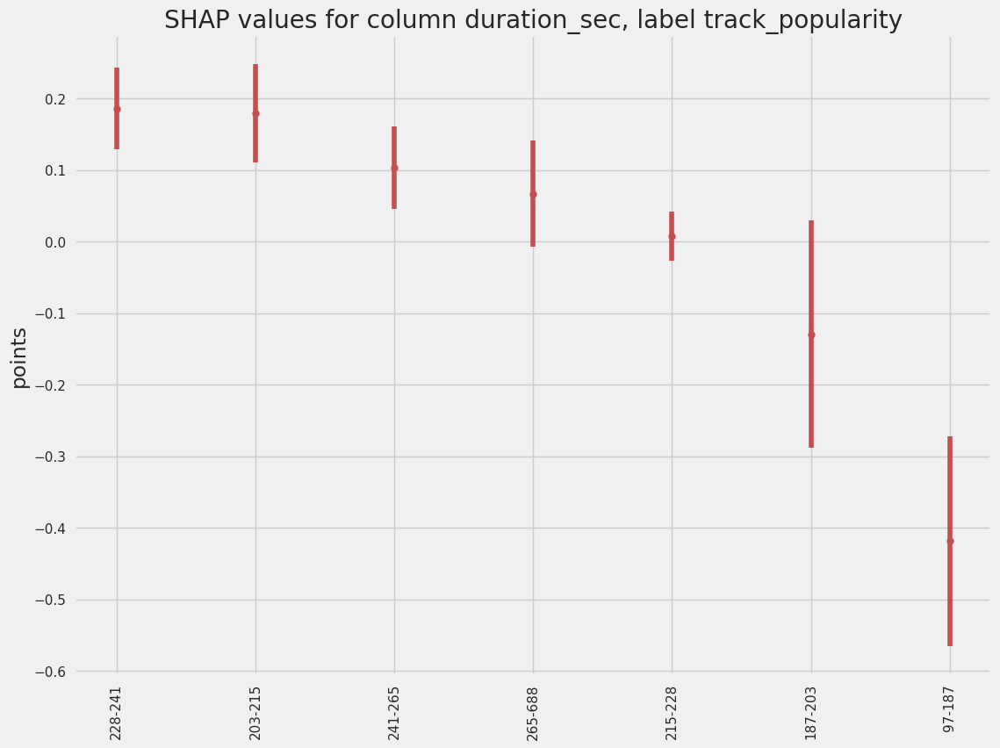

          gain   gain_std  count
col                             
228-241  0.1859   0.0573    180 
203-215  0.1795   0.0689    174 
241-265  0.1037   0.0579    172 
265-688  0.0671   0.0739    154 
215-228  0.0073   0.0345    156 
187-203 -0.1295   0.1588    151 
97-187  -0.4189   0.1463    163 


In [21]:
def show_shap(col, shap_values=shap_values, label=main_label, X_test=X_test, ylabel='points'):
    df_infl = X_test.copy()
    df_infl['shap_'] = shap_values[:,df_infl.columns.tolist().index(col)]
    gain = round(df_infl.groupby(col).mean()['shap_'],4)
    gain_std = round(df_infl.groupby(col).std()['shap_'],4)
    cnt = df_infl.groupby(col).count()['shap_']
    dd_dict = {'col': list(gain.index), 'gain': list(gain.values), 'gain_std': list(gain_std.values), 'count': cnt}
    df_res = pd.DataFrame.from_dict(dd_dict).sort_values('gain', ascending=False).set_index('col')
    plt.figure(figsize=(12,9))
    plt.errorbar(df_res.index, df_res['gain'], yerr=df_res['gain_std'], fmt="o", color="r")
    plt.title(f'SHAP values for column {col}, label {label}')
    plt.ylabel(ylabel)
    plt.tick_params(axis="x", rotation=90)
    plt.show();
    print(df_res)
    return

for col in X_test.columns:
    if not col.startswith('artist_genres'):
        print()
        print(col)
        print()
        show_shap(col, shap_values, label=main_label, X_test=X_test)